# Portfolio Optimizer
#### Trading CFDs i would like to create a portfolio that has a maximum drawdown limited to the margin call limit from the CFD broker. Trade indices and commodities and use fx to hedge currency movements. 

In [1]:
pip install MetaTrader5


Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install python-dotenv

Note: you may need to restart the kernel to use updated packages.


In [3]:
import MetaTrader5 as mt5
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
import pytz
pd.set_option('display.max_columns', 500) # number of columns to be displayed
pd.set_option('display.width', 1500)      # max table width to display
pd.set_option('display.max_rows', 5000)
import hvplot.pandas
import pypfopt
import matplotlib.pyplot as plt
from pypfopt.expected_returns import mean_historical_return
from pypfopt import plotting, base_optimizer, risk_models, expected_returns, EfficientSemivariance, objective_functions
from pypfopt.risk_models import risk_matrix
from pypfopt.efficient_frontier import EfficientFrontier, EfficientCDaR
import seaborn as sns
import scipy.optimize as sco
import requests
from pathlib import Path
from dotenv import load_dotenv
import os


## Connect to Metatrader and obtain account details

In [20]:
# Load variables from the .env file
load_dotenv("aaa.env")
# Access the variables
login = int(os.getenv("LOGIN"))
password = os.getenv("PASSWORD")
server = os.getenv("SERVER")
path_1_mt = os.getenv("path_1_mt")

In [21]:
#ThinkMarkets account
timeout = 10000
portable = False

if mt5.initialize(path=path_1_mt, login=login, password=password, server=server, timeout=timeout, portable=portable)
    print("Initialization successful")
    

True

In [57]:
# Get account info
account_info_dict = mt5.account_info()._asdict()
account_info_df = pd.DataFrame(account_info_dict, index=[0])
account_info_df

,login,trade_mode,leverage,limit_orders,margin_so_mode,trade_allowed,trade_expert,margin_mode,currency_digits,fifo_close,balance,credit,profit,equity,margin,margin_free,margin_level,margin_so_call,margin_so_so,margin_initial,margin_maintenance,assets,liabilities,commission_blocked,name,server,currency,company
0,59841,0,30,100,0,True,True,2,2,False,99961.74,0.0,0.0,99961.74,0.0,99961.74,0.0,100.0,50.0,0.0,0.0,0.0,0.0,0.0,Joshua Luke Tenison Woods,ThinkMarkets-Demo,AUD,TF Global Markets (Aust) Pty Ltd


In [58]:
# display relevant information
print("Profit:", account_info_df["profit"].loc[0])
print("Equity:", account_info_df["equity"].loc[0])
print("Margin:", account_info_df["margin"].loc[0])
print("Margin Free:", account_info_df["margin_free"].loc[0])

Profit: 0.0
Equity: 99961.74
Margin: 0.0
Margin Free: 99961.74


## Retrieve ticker data from Metatrader and concatenate into dataframe for PyportfolioOpt analyse

In [59]:
# Get bars function to recieve daily ticker data
def get_bars_data(symbol):

    # set time zone to UTC
    timezone = pytz.timezone("Etc/UTC")
    # create 'datetime' object in UTC time zone to avoid the implementation of a local time zone offset
    utc_from = datetime(2010, 11, 1, tzinfo=timezone)
    utc_to = datetime(2023, 11, 1, tzinfo=timezone)
    # get 10 EURUSD H4 bars starting from 01.10.2020 in UTC time zone
    rates = mt5.copy_rates_range(symbol, mt5.TIMEFRAME_D1, utc_from, utc_to)
    # create DataFrame out of the obtained data
    rates_frame = pd.DataFrame(rates)
    # convert time in seconds into the datetime format
    rates_frame['time']=pd.to_datetime(rates_frame['time'], unit='s')
    #Set index to time
    rates_frame = rates_frame.set_index('time')
    # Remove unwanted columns
    rates_frame = rates_frame['close']
    # Change series into df
    rates_frame = pd.DataFrame(rates_frame)
    #Rename column to symbol
    rates_frame = rates_frame.rename(columns={'close':symbol})
    return rates_frame
    
    

In [60]:
EURUSDx = get_bars_data('EURUSDx')
AUDUSDx = get_bars_data('AUDUSDx')
GBPUSDx = get_bars_data('GBPUSDx')
USDJPYx = get_bars_data('USDJPYx')
USDCHFx = get_bars_data('USDCHFx')
XAUUSDx = get_bars_data('XAUUSDx')
XAUEURx = get_bars_data('XAUEURx')
XAGUSDx = get_bars_data('XAGUSDx')
GBPAUDx = get_bars_data('GBPAUDx')
EURAUDx = get_bars_data('EURAUDx')
AUDJPYx = get_bars_data('AUDJPYx')
BRENT = get_bars_data('BRENT')
NGAS = get_bars_data('NGAS')
COPPER = get_bars_data('COPPER')
WTI = get_bars_data('WTI')
BRENT = get_bars_data('BRENT')
WHEAT = get_bars_data('WHEAT')
CORN = get_bars_data('CORN')
SOYBEANS = get_bars_data('SOYBEANS')
ESTX50 = get_bars_data('ESTX50')
FRA40 = get_bars_data('FRA40')
GER40 = get_bars_data('GER40')
AUS200 = get_bars_data('AUS200')
UK100 = get_bars_data('UK100')
US30 = get_bars_data('US30')
JPN225 = get_bars_data('JPN225')
NAS100 = get_bars_data('NAS100')
SPX500 = get_bars_data('SPX500')
US2000 = get_bars_data('US2000')
ETHUSD = get_bars_data('ETHUSD')
BTCUSD = get_bars_data('BTCUSD')

In [61]:
# Concatenate dataframes
df = pd.concat([XAUUSDx, XAGUSDx,   
                ESTX50, FRA40, GER40, AUS200, UK100, US30, JPN225, NAS100, SPX500, US2000,
                WTI, AUDUSDx, EURAUDx, GBPAUDx, AUDJPYx   # Added currencies may need to remove, dont think currency for growth is good because past performance is not indicitave of future performance. 
               ], join='outer', axis=1)
df = df.dropna()
display(df.head(3))
display(df.tail(3))

# deleted these as they had the most nans SOYBEANS, XAUEURx,COPPER, NGAS, WHEAT, CORN, ETHUSD, BTCUSD, AUDUSDx, GBPAUDx, EURAUDx
# removed fx to check returns without them GBPUSDx, AUDUSDx, USDCHFx,EURUSDx,USDJPYx

,XAUUSDx,XAGUSDx,ESTX50,FRA40,GER40,AUS200,UK100,US30,JPN225,NAS100,SPX500,US2000,WTI,AUDUSDx,EURAUDx,GBPAUDx,AUDJPYx
time,,,,,,,,,,,,,,,,,
2012-08-30,1655.18,30.43,2413.0,3380.0,6900.0,4301.0,5716.0,12986.0,8910.0,2752.0,1397.9,807.1,94.55,1.02925,1.21454,1.53430,80.906
2012-08-31,1690.81,31.64,2438.0,3400.0,6957.0,4339.0,5710.0,13092.0,8880.0,2771.0,1407.4,807.5,96.59,1.03192,1.21793,1.53570,80.883
2012-09-03,1692.42,32.08,2464.0,3453.0,7011.0,4335.0,5754.0,13093.0,8790.0,2776.0,1408.1,817.0,96.83,1.02421,1.22843,1.54962,80.176


,XAUUSDx,XAGUSDx,ESTX50,FRA40,GER40,AUS200,UK100,US30,JPN225,NAS100,SPX500,US2000,WTI,AUDUSDx,EURAUDx,GBPAUDx,AUDJPYx
time,,,,,,,,,,,,,,,,,
2023-10-30,1996.23,23.305,4040.00,6847.2,14764.50,6803.05,7337.40,32927.73,30564.00,14332.07,4169.86,1643.24,82.26,0.63740,1.66474,1.90863,95.012
2023-10-31,1983.92,22.835,4069.03,6901.0,14850.50,6809.50,7331.95,32997.84,31358.20,14375.44,4189.45,1656.04,81.15,0.63369,1.66847,1.91731,96.046
2023-11-01,1982.69,22.931,4110.00,6965.3,14993.98,6886.62,7370.90,33276.45,31899.55,14682.55,4245.10,1667.01,80.70,0.63930,1.65302,1.90023,96.510


### Convert prices into AUD to give real returns for optimiser. Also add AUDUSD, EURUSD, AUDJPY, GBPAUD for currency conversions and to allow hedging 

In [62]:
df.to_csv('project_data.csv')

In [63]:
df.isna().sum()

XAUUSDx    0
XAGUSDx    0
ESTX50     0
FRA40      0
GER40      0
AUS200     0
UK100      0
US30       0
JPN225     0
NAS100     0
SPX500     0
US2000     0
WTI        0
AUDUSDx    0
EURAUDx    0
GBPAUDx    0
AUDJPYx    0
dtype: int64

## Covert prices to AUD for realistic returns in the optimiser

In [64]:
# Function to perform multiple calculations and return a Series with results
def multiple_calculations(row):
    result = pd.Series()
    result['XAUUSD_AUD'] = row['XAUUSDx'] * (1 / row['AUDUSDx'])
    result['XAGUSD_AUD'] = row['XAGUSDx'] * (1 / row['AUDUSDx'])
    result['ESTX50_AUD'] = row['ESTX50'] * row['EURAUDx']
    result['FRA40_AUD'] = row['FRA40'] * row['EURAUDx']
    result['GER40_AUD'] = row['GER40'] * row['EURAUDx']
    result['UK100_AUD'] = row['UK100'] * row['EURAUDx']
    result['US30_AUD'] = row['US30'] * (1 / row['AUDUSDx'])
    result['JPN225_AUD'] = row['JPN225'] * (1 / row['AUDJPYx'])
    result['NAS100_AUD'] = row['NAS100'] * (1 / row['AUDUSDx'])
    result['SPX500_AUD'] = row['SPX500'] * (1 / row['AUDUSDx'])
    result['US2000_AUD'] = row['US2000'] * (1 / row['AUDUSDx'])
    result['WTI_AUD'] = row['WTI'] * (1 / row['AUDUSDx'])     

    return result

# Apply the function to create multiple new columns
new_columns = df.apply(multiple_calculations, axis=1)

new_columns

C:\Users\duke_\anaconda3\envs\alpacaenv\lib\site-packages\ipykernel_launcher.py:3: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\duke_\anaconda3\envs\alpacaenv\lib\site-packages\ipykernel_launcher.py:3: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  This is separate from the ipykernel package so we can avoid doing imports until


,XAUUSD_AUD,XAGUSD_AUD,ESTX50_AUD,FRA40_AUD,GER40_AUD,UK100_AUD,US30_AUD,JPN225_AUD,NAS100_AUD,SPX500_AUD,US2000_AUD,WTI_AUD
time,,,,,,,,,,,,
2012-08-30,1608.141851,29.565217,2930.685020,4105.145200,8380.326000,6942.310640,12616.954093,110.127803,2673.791596,1358.173427,784.163226,91.863007
2012-08-31,1638.508799,30.661292,2969.313340,4140.962000,8473.139010,6954.380300,12687.030002,109.788213,2685.285681,1363.865416,782.521901,93.602217
2012-09-03,1652.415032,31.321702,3026.851520,4241.768790,8612.522730,7068.386220,12783.511194,109.633806,2710.381660,1374.815712,797.687974,94.541159
2012-09-04,1658.460004,31.603967,3004.122600,4189.798800,8545.469400,6982.588440,12747.226950,109.356681,2708.492282,1373.417845,804.429055,93.276209
2012-09-05,1660.626337,31.620980,3010.652400,4205.767700,8604.335800,6992.722200,12809.293017,108.733198,2715.695701,1378.451033,807.252320,93.940702
2012-09-06,1653.387539,31.725962,3101.053500,4308.315120,8794.710540,7094.964780,12919.916746,109.273443,2747.573382,1393.141279,814.837869,92.201755
2012-09-07,1671.380134,32.413116,3132.709000,4342.625350,8908.487050,7144.796550,12810.164137,109.033808,2719.234029,1386.009864,806.812052,92.760268
2012-09-10,1670.244167,32.255567,3102.627960,4308.382740,8872.232460,7120.987800,12804.482682,108.924972,2694.254386,1380.611820,810.502173,93.127909
2012-09-11,1660.727130,32.088844,3146.298140,4351.106120,8990.479180,7129.063170,12754.979717,108.611231,2665.119446,1371.975487,805.481764,92.881187


In [65]:
df_forex = df[['AUDUSDx', 'EURAUDx', 'GBPAUDx', 'AUDJPYx']]
df_forex

,AUDUSDx,EURAUDx,GBPAUDx,AUDJPYx
time,,,,
2012-08-30,1.02925,1.21454,1.53430,80.906
2012-08-31,1.03192,1.21793,1.53570,80.883
2012-09-03,1.02421,1.22843,1.54962,80.176
2012-09-04,1.02234,1.22868,1.55203,80.178
2012-09-05,1.01926,1.23590,1.55979,79.902
2012-09-06,1.02818,1.22814,1.54937,81.081
2012-09-07,1.03816,1.23335,1.54060,81.195
2012-09-10,1.03331,1.23414,1.54677,80.863
2012-09-11,1.04273,1.23191,1.53984,81.115


In [66]:
# Concatenate the new columns to the original DataFrame
df_aud = pd.concat([df_forex, new_columns], axis=1)
df_aud

,AUDUSDx,EURAUDx,GBPAUDx,AUDJPYx,XAUUSD_AUD,XAGUSD_AUD,ESTX50_AUD,FRA40_AUD,GER40_AUD,UK100_AUD,US30_AUD,JPN225_AUD,NAS100_AUD,SPX500_AUD,US2000_AUD,WTI_AUD
time,,,,,,,,,,,,,,,,
2012-08-30,1.02925,1.21454,1.53430,80.906,1608.141851,29.565217,2930.685020,4105.145200,8380.326000,6942.310640,12616.954093,110.127803,2673.791596,1358.173427,784.163226,91.863007
2012-08-31,1.03192,1.21793,1.53570,80.883,1638.508799,30.661292,2969.313340,4140.962000,8473.139010,6954.380300,12687.030002,109.788213,2685.285681,1363.865416,782.521901,93.602217
2012-09-03,1.02421,1.22843,1.54962,80.176,1652.415032,31.321702,3026.851520,4241.768790,8612.522730,7068.386220,12783.511194,109.633806,2710.381660,1374.815712,797.687974,94.541159
2012-09-04,1.02234,1.22868,1.55203,80.178,1658.460004,31.603967,3004.122600,4189.798800,8545.469400,6982.588440,12747.226950,109.356681,2708.492282,1373.417845,804.429055,93.276209
2012-09-05,1.01926,1.23590,1.55979,79.902,1660.626337,31.620980,3010.652400,4205.767700,8604.335800,6992.722200,12809.293017,108.733198,2715.695701,1378.451033,807.252320,93.940702
2012-09-06,1.02818,1.22814,1.54937,81.081,1653.387539,31.725962,3101.053500,4308.315120,8794.710540,7094.964780,12919.916746,109.273443,2747.573382,1393.141279,814.837869,92.201755
2012-09-07,1.03816,1.23335,1.54060,81.195,1671.380134,32.413116,3132.709000,4342.625350,8908.487050,7144.796550,12810.164137,109.033808,2719.234029,1386.009864,806.812052,92.760268
2012-09-10,1.03331,1.23414,1.54677,80.863,1670.244167,32.255567,3102.627960,4308.382740,8872.232460,7120.987800,12804.482682,108.924972,2694.254386,1380.611820,810.502173,93.127909
2012-09-11,1.04273,1.23191,1.53984,81.115,1660.727130,32.088844,3146.298140,4351.106120,8990.479180,7129.063170,12754.979717,108.611231,2665.119446,1371.975487,805.481764,92.881187


In [67]:
df_aud.isna().sum()

AUDUSDx       0
EURAUDx       0
GBPAUDx       0
AUDJPYx       0
XAUUSD_AUD    0
XAGUSD_AUD    0
ESTX50_AUD    0
FRA40_AUD     0
GER40_AUD     0
UK100_AUD     0
US30_AUD      0
JPN225_AUD    0
NAS100_AUD    0
SPX500_AUD    0
US2000_AUD    0
WTI_AUD       0
dtype: int64

In [71]:
# Function to calculate average gain for each column
def calculate_average_gain(column):
    first_row = column.iloc[0]  # First row value
    last_row = column.iloc[-1]  # Last row value
    average_gain = ((last_row - first_row) / first_row) * 100
    return average_gain

# Loop through each column in the DataFrame
for col in df_aud.columns:
    avg_gain = calculate_average_gain(df_aud[col])
    print(f"Column '{col}': Average Gain = {avg_gain}")

    

Column 'AUDUSDx': Average Gain = -37.88681078455186
Column 'EURAUDx': Average Gain = 36.10255734681445
Column 'GBPAUDx': Average Gain = 23.849964153033962
Column 'AUDJPYx': Average Gain = 19.286579487306255
Column 'XAUUSD_AUD': Average Gain = 92.85271505575885
Column 'XAGUSD_AUD': Average Gain = 21.321344117186996
Column 'ESTX50_AUD': Average Gain = 131.8199381249098
Column 'FRA40_AUD': Average Gain = 180.47193570643984
Column 'GER40_AUD': Average Gain = 195.75638011695494
Column 'UK100_AUD': Average Gain = 75.50705737362397
Column 'US30_AUD': Average Gain = 312.55111133651997
Column 'JPN225_AUD': Average Gain = 200.13404893638716
Column 'NAS100_AUD': Average Gain = 758.9526623584935
Column 'SPX500_AUD': Average Gain = 388.90895447996473
Column 'US2000_AUD': Average Gain = 232.5270878740944
Column 'WTI_AUD': Average Gain = 37.41311123028122


In [72]:
#Calculate daily change stocks
combined_returns = df_aud.pct_change()
combined_returns = combined_returns.dropna()

display(combined_returns)

,AUDUSDx,EURAUDx,GBPAUDx,AUDJPYx,XAUUSD_AUD,XAGUSD_AUD,ESTX50_AUD,FRA40_AUD,GER40_AUD,UK100_AUD,US30_AUD,JPN225_AUD,NAS100_AUD,SPX500_AUD,US2000_AUD,WTI_AUD
time,,,,,,,,,,,,,,,,
2012-08-31,0.002594,0.002791,0.000912,-0.000284,0.018883,0.037073,0.013181,0.008725,0.011075,0.001739,0.005554,-3.083599e-03,0.004299,0.004191,-0.002093,0.018933
2012-09-03,-0.007472,0.008621,0.009064,-0.008741,0.008487,0.021539,0.019378,0.024344,0.016450,0.016393,0.007605,-1.406408e-03,0.009346,0.008029,0.019381,0.010031
2012-09-04,-0.001826,0.000204,0.001555,0.000025,0.003658,0.009012,-0.007509,-0.012252,-0.007786,-0.012138,-0.002838,-2.527726e-03,-0.000697,-0.001017,0.008451,-0.013380
2012-09-05,-0.003013,0.005876,0.005000,-0.003442,0.001306,0.000538,0.002174,0.003811,0.006889,0.001451,0.004869,-5.701373e-03,0.002660,0.003665,0.003510,0.007124
2012-09-06,0.008751,-0.006279,-0.006680,0.014756,-0.004359,0.003320,0.030027,0.024383,0.022125,0.014621,0.008636,4.968533e-03,0.011738,0.010657,0.009397,-0.018511
2012-09-07,0.009706,0.004242,-0.005660,0.001406,0.010882,0.021659,0.010208,0.007964,0.012937,0.007024,-0.008495,-2.192986e-03,-0.010314,-0.005119,-0.009850,0.006058
2012-09-10,-0.004672,0.000641,0.004005,-0.004089,-0.000680,-0.004861,-0.009602,-0.007885,-0.004070,-0.003332,-0.000444,-9.981825e-04,-0.009186,-0.003895,0.004574,0.003963
2012-09-11,0.009116,-0.001807,-0.004480,0.003116,-0.005698,-0.005169,0.014075,0.009916,0.013328,0.001134,-0.003866,-2.880339e-03,-0.010814,-0.006255,-0.006194,-0.002649
2012-09-12,0.003280,0.000382,-0.000968,0.003760,-0.004035,-0.011610,0.002340,0.003214,0.005727,-0.000483,0.000703,1.208550e-02,0.001752,0.002305,0.004445,-0.002446


## Analyse data

In [73]:
# Plot returns to visualise data

cum_returns_index = (1 + combined_returns).cumprod(axis=0)
cum_returns_index

# Plot cumulative returns
cum_returns_index.hvplot(
    width=1500,
    height=900,
    rot=45
)

:NdOverlay   [Variable]
   :Curve   [time]   (value)

In [74]:
# Calculate the annualized `std`
portfolio_std = combined_returns.std() * np.sqrt(252)
#portfolio_std.plot(kind="bar", title="Sharpe Ratios")
portfolio_std.hvplot.bar( title="annualised standard deviation", rot=45)

:Bars   [index]   (0)

In [75]:
#Plot covariance
co_var = risk_models.risk_matrix(df, method='sample_cov')
co_var

,XAUUSDx,XAGUSDx,ESTX50,FRA40,GER40,AUS200,UK100,US30,JPN225,NAS100,SPX500,US2000,WTI,AUDUSDx,EURAUDx,GBPAUDx,AUDJPYx
XAUUSDx,0.021766,0.031273,-0.001836,-0.001959,-0.001663,-0.000007,-0.000799,0.000337,-0.003566,0.001189,0.000721,0.000805,0.006385,0.005627,-0.001466,-0.001848,0.000094
XAGUSDx,0.031273,0.071399,0.006772,0.006380,0.006823,0.006487,0.006261,0.007911,0.004102,0.010235,0.008776,0.011177,0.021379,0.011611,-0.004726,-0.003981,0.005636
ESTX50,-0.001836,0.006772,0.040344,0.038524,0.038242,0.025739,0.027990,0.027193,0.030751,0.030296,0.027972,0.032513,0.022163,0.006660,-0.006817,-0.003089,0.012842
FRA40,-0.001959,0.006380,0.038524,0.038666,0.036291,0.025387,0.027682,0.026358,0.029372,0.028361,0.026794,0.031464,0.022282,0.006382,-0.006573,-0.003051,0.012446
GER40,-0.001663,0.006823,0.038242,0.036291,0.039572,0.024962,0.026917,0.026455,0.029263,0.029517,0.026994,0.031983,0.019661,0.006447,-0.006736,-0.003007,0.012111
AUS200,-0.000007,0.006487,0.025739,0.025387,0.024962,0.031622,0.021958,0.022168,0.022252,0.023871,0.022425,0.026302,0.023870,0.004638,-0.004890,-0.002445,0.009182
UK100,-0.000799,0.006261,0.027990,0.027682,0.026917,0.021958,0.026665,0.021483,0.022900,0.022045,0.021379,0.025265,0.021845,0.005071,-0.005310,-0.004668,0.009880
US30,0.000337,0.007911,0.027193,0.026358,0.026455,0.022168,0.021483,0.028108,0.024247,0.028860,0.027446,0.030647,0.020949,0.006854,-0.005607,-0.003177,0.010658
JPN225,-0.003566,0.004102,0.030751,0.029372,0.029263,0.022252,0.022900,0.024247,0.044691,0.028068,0.025351,0.029279,0.020178,0.005395,-0.006120,-0.003131,0.016603
NAS100,0.001189,0.010235,0.030296,0.028361,0.029517,0.023871,0.022045,0.028860,0.028068,0.043809,0.033119,0.035520,0.018202,0.007954,-0.006321,-0.003823,0.011506


<AxesSubplot:>

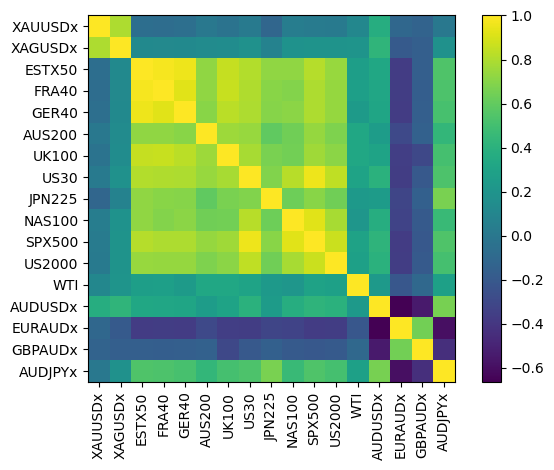

In [76]:
plotting.plot_covariance(co_var, plot_correlation=True, show_tickers=True)

## Generate Effcicent Frontier

In [77]:
mu = expected_returns.mean_historical_return(df, returns_data=False, compounding=True, frequency=252, log_returns=False)
S = risk_models.sample_cov(df, returns_data=False, frequency=252, log_returns=False)


### Max Sharpe Long only

OrderedDict([('XAUUSDx', 0.0045), ('XAGUSDx', 0.0), ('ESTX50', 0.0), ('FRA40', 0.0), ('GER40', 0.0), ('AUS200', 0.0), ('UK100', 0.0), ('US30', 0.0), ('JPN225', 0.08636), ('NAS100', 0.41809), ('SPX500', 0.0), ('US2000', 0.0), ('WTI', 0.0), ('AUDUSDx', 0.0), ('EURAUDx', 0.49106), ('GBPAUDx', 0.0), ('AUDJPYx', 0.0)])
Expected annual return: 9.3%
Annual volatility: 9.5%
Sharpe Ratio: 0.77


<AxesSubplot:xlabel='Weight'>

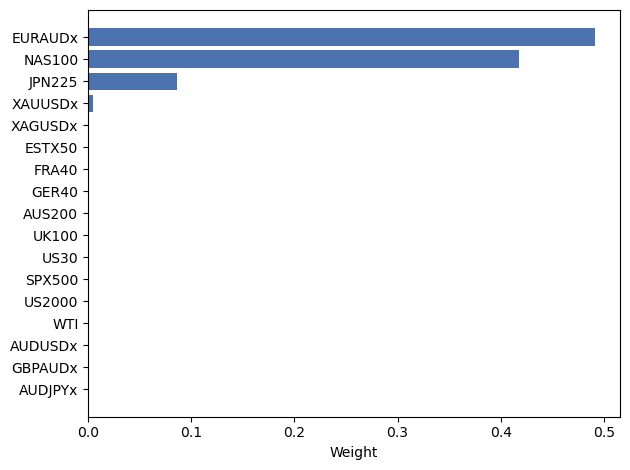

In [78]:
# Optimize the max sharpe ratio
ef = EfficientFrontier(mu,S,verbose=False, weight_bounds=(0,None))
weights = ef.max_sharpe()
cleaned_weights = ef.clean_weights()
print(cleaned_weights)
ef.portfolio_performance(verbose=True)
plotting.plot_weights(cleaned_weights, ax=None)

## Max Sharpe Ratio with shorts

OrderedDict([('XAUUSDx', 0.81295), ('XAGUSDx', -0.30256), ('ESTX50', -1.0), ('FRA40', 0.81339), ('GER40', 0.40818), ('AUS200', -0.16281), ('UK100', -0.56428), ('US30', 0.41571), ('JPN225', 0.157), ('NAS100', 0.6924), ('SPX500', -0.00372), ('US2000', -0.31579), ('WTI', 0.00771), ('AUDUSDx', -1.0), ('EURAUDx', 0.62254), ('GBPAUDx', -0.21079), ('AUDJPYx', 0.63007)])
Expected annual return: 25.0%
Annual volatility: 15.7%
Sharpe Ratio: 1.47


<AxesSubplot:xlabel='Weight'>

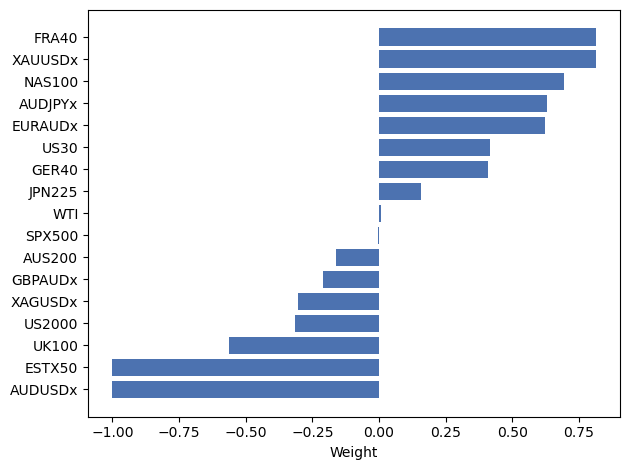

In [79]:
# Optimize the max sharpe ratio
ef = EfficientFrontier(mu,S,verbose=False, weight_bounds=(-1, 1))
weights = ef.max_sharpe()
cleaned_weights = ef.clean_weights()
print(cleaned_weights)
ef.portfolio_performance(verbose=True)
plotting.plot_weights(cleaned_weights, ax=None)

## Efficient Cdar


In [80]:
mu = expected_returns.mean_historical_return(df, returns_data=False, compounding=True, frequency=252, log_returns=False)
historical_returns = expected_returns.returns_from_prices(df).dropna()

,XAUUSDx,XAGUSDx,ESTX50,FRA40,GER40,AUS200,UK100,US30,JPN225,NAS100,SPX500,US2000,WTI,AUDUSDx,EURAUDx,GBPAUDx,AUDJPYx
0,1.0,-0.12773,-1.0,1.0,0.20965,-0.25206,-1.0,1.0,1.0,0.90877,-0.14308,-0.79494,0.01005,-1.0,0.72975,-1.0,0.45959


Expected annual return: 36.0%
Conditional Drawdown at Risk: 20.00%


<AxesSubplot:xlabel='Weight'>

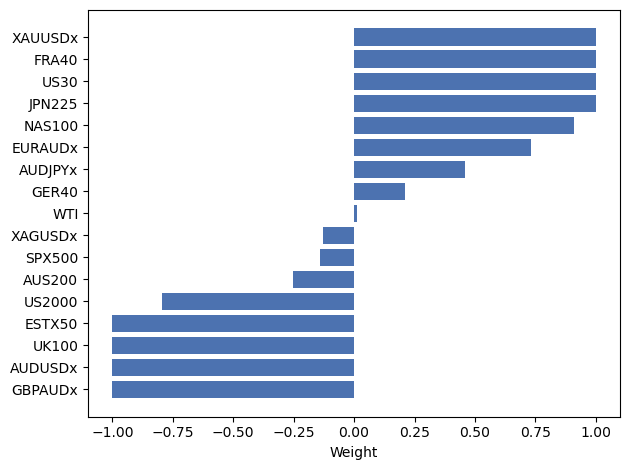

In [84]:
ef_cdar = EfficientCDaR(mu, historical_returns, weight_bounds=(-1,1), beta=0.99, verbose=False)
# ef_cdar.add_objective(objective_functions.L2_reg, gamma=.3)
weights = ef_cdar.efficient_risk(0.20, market_neutral=False)
cleaned_weights = ef_cdar.clean_weights()
cleaned_weights_1 = pd.DataFrame(cleaned_weights, index=[0])
display(cleaned_weights_1)
ef_cdar.portfolio_performance(verbose=True)
plotting.plot_weights(cleaned_weights, ax=None)


### Cdar with AUD returns

In [82]:
mu_aud = expected_returns.mean_historical_return(df_aud, returns_data=False, compounding=True, frequency=252, log_returns=False)
historical_returns_aud = expected_returns.returns_from_prices(df_aud).dropna()

,XAUUSDx,XAGUSDx,ESTX50,FRA40,GER40,AUS200,UK100,US30,JPN225,NAS100,SPX500,US2000,WTI,AUDUSDx,EURAUDx,GBPAUDx,AUDJPYx
0,1.0,-0.12773,-1.0,1.0,0.20965,-0.25206,-1.0,1.0,1.0,0.90877,-0.14308,-0.79494,0.01005,-1.0,0.72975,-1.0,0.45959


Expected annual return: 39.2%
Conditional Drawdown at Risk: 20.00%


<AxesSubplot:xlabel='Weight'>

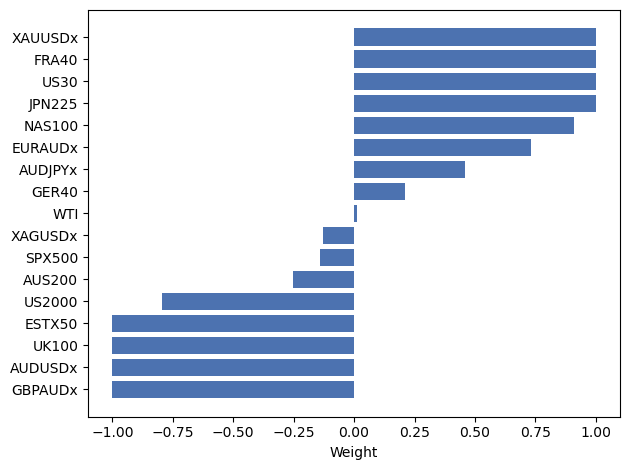

In [85]:
ef_cdar_aud = EfficientCDaR(mu_aud, historical_returns_aud, weight_bounds=(-1,1), beta=0.99, verbose=False)
# ef_cdar.add_objective(objective_functions.L2_reg, gamma=.3)
weights_aud = ef_cdar_aud.efficient_risk(0.20, market_neutral=False)
cleaned_weights_aud = ef_cdar.clean_weights()
cleaned_weights_2 = pd.DataFrame(cleaned_weights_aud, index=[0])
display(cleaned_weights_2)
ef_cdar_aud.portfolio_performance(verbose=True)
plotting.plot_weights(cleaned_weights_aud, ax=None)

## Portfolio calc. Needs work

In [ ]:
# Calculate weighting for short and long positions for portfolio

# Calculate long and short weights separately
long_weights = {ticker: weight for ticker, weight in cleaned_weights.items() if weight > 0}
# print(long_weights)
short_weights = {ticker: weight for ticker, weight in cleaned_weights.items() if weight < 0}
# print(short_weights)

# Calculate total long and short weights
total_long_weight = sum(long_weights.values())
# print(total_long_weight)
total_short_weight = abs(sum(short_weights.values()))
# print(total_short_weight)

short_long_total = total_long_weight + total_short_weight
# print(short_long_total)

# Calculate long and short allocations based on the total portfolio value
portfolio_value = 10000000  # Replace this with your actual portfolio value
long_allocation = {ticker: int((weight / short_long_total) * portfolio_value) for ticker, weight in long_weights.items()}
# print(long_allocation)
short_allocation = {ticker: int((abs(weight) / short_long_total) * portfolio_value) for ticker, weight in short_weights.items()}
# print(short_allocation)

# Combine long and short allocations
allocation = {**long_allocation, **short_allocation}

print("Allocation ($ value per asset) (Long/Short):", allocation)


In [ ]:
# Display weights in dataframe so its easy to read
e = pd.DataFrame(weights, index=[0])
display(e)
# Summing a row
row_sum = e.sum(axis=1)
abs_sum = e.abs().sum(axis=1)
display(row_sum)
display(abs_sum)

In [ ]:
# Need to know what my maximum drawdown can be to prevent margin call as then i can optimise the portfolio to that

## Buy assets

In [ ]:
# Need to know how much equity or free margin is available in the account to trade.

In [86]:
# Retrieve account information
account = mt5.account_info()
if account:
    balance = account.balance
    equity = account.equity
    free_margin = account.margin_free
    print(f"Balance: {balance}")
    print(f"Equity: {equity}")
    print(f"Free Margin: {free_margin}")
else:
    print("Failed to retrieve account information")

Balance: 99961.74
Equity: 99961.74
Free Margin: 99961.74


In [87]:
request = {
    "action": mt5.TRADE_ACTION_DEAL,
    "symbol": 'XAUUSDx',
    "volume": 1.0,
    "type": mt5.ORDER_TYPE_SELL,
    "comment": "InUpBot MrEurUsd",
    "type_time": mt5.ORDER_TIME_GTC,
    "type_filling": mt5.ORDER_FILLING_FOK}
print('Se ejecutó una compra por 0.01')
mt5.order_send(request)


Se ejecutó una compra por 0.01


OrderSendResult(retcode=10009, deal=47110200, order=55655245, volume=1.0, price=2041.81, bid=2041.81, ask=2041.89, comment='Request executed', request_id=954269164, retcode_external=0, request=TradeRequest(action=1, magic=0, order=0, symbol='XAUUSDx', volume=1.0, price=0.0, stoplimit=0.0, sl=0.0, tp=0.0, deviation=0, type=1, type_filling=0, type_time=0, expiration=0, comment='InUpBot MrEurUsd', position=0, position_by=0))

In [ ]:
place_order_long('XAUUSDx', 1.0)

In [ ]:
mt5.shutdown()